In [ ]:
# Install dependencies.
!pip install xformers bitsandbytes transformers accelerate -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 167.0/167.0 MB 5.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 92.6/92.6 MB 7.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.6/7.6 MB 48.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 258.1/258.1 kB 23.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 295.0/295.0 kB 23.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 54.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 71.0 MB/s eta 0:00:00


In [ ]:
!pip install git+https://github.com/huggingface/diffusers.git -q

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


In [ ]:
!wget https://raw.githubusercontent.com/huggingface/diffusers/main/examples/dreambooth/train_dreambooth_lora_sdxl.py

--2023-09-26 13:38:34--  https://raw.githubusercontent.com/huggingface/diffusers/main/examples/dreambooth/train_dreambooth_lora_sdxl.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 57659 (56K) [text/plain]
Saving to: ‘train_dreambooth_lora_sdxl.py’

train_dreambooth_lo 100%[===================>]  56.31K  --.-KB/s    in 0.04s   

2023-09-26 13:38:34 (1.28 MB/s) - ‘train_dreambooth_lora_sdxl.py’ saved [57659/57659]



In [ ]:
from diffusers import DiffusionPipeline
import torch

from diffusers import DiffusionPipeline, AutoencoderKL

vae = AutoencoderKL.from_pretrained("madebyollin/sdxl-vae-fp16-fix", torch_dtype=torch.float16)
pipe = DiffusionPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    vae=vae, torch_dtype=torch.float16, variant="fp16",
    use_safetensors=True
)
# pipe.load_lora_weights("sayakpaul/lora-trained-xl-colab")
pipe.load_lora_weights("gbellamy/lora-trained-xl-colab")

_ = pipe.to("cuda")

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

Fetching 17 files:   0%|          | 0/17 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

https://stable-diffusion-art.com/how-to-come-up-with-good-prompts-for-ai-image-generation/

1. Subject (required)
2. Medium
3. Style
4. Artist
5. Website
6. Resolution
7. Additional details
8. Color
9. Lighting

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
from PIL import Image

def create_prompt(subject='suezzeus dog', subject_2='', medium=None, artist=None, website=None, resolution=None, additional_details=None, lighting=None, color=None):
  prompt = subject
  if subject_2:
    prompt += ' ' + subject_2
  if medium:
    prompt = medium + ' of ' + prompt
  if artist:
    prompt += ', by ' + artist
  if website:
    prompt += ', ' + website
  if resolution:
    prompt += ', ' + resolution
  if additional_details:
    prompt += ', ' + additional_details
  if lighting:
    prompt += ', ' + lighting
  if color:
    prompt += ', ' + color
  return prompt

from google.colab import auth
auth.authenticate_user()
import gspread
from google.auth import default
creds, _ = default()
gc = gspread.authorize(creds)
import datetime
current_date = datetime.datetime.now().strftime('%Y-%m-%d')

# https://colab.research.google.com/notebooks/snippets/sheets.ipynb#scrollTo=6d0xJz3VzLOo
def save_prompt(photo_name, prompt, file_name='sdxl_prompts'):
  try:
    worksheet = gc.open(file_name).sheet1
  except gspread.SpreadsheetNotFound:
      sh = gc.create(file_name)
      worksheet = gc.open(file_name).sheet1

  values_list = worksheet.col_values(1)
  last_filled_row = len(values_list)

  cell_range = 'A{}:C{}'.format(last_filled_row + 1, last_filled_row + 1)
  cell_list = worksheet.range(cell_range)

  cell_list[0].value = current_date
  cell_list[1].value = photo_name
  cell_list[2].value = prompt

  worksheet.update_cells(cell_list)


def create_save_image(prompt, file_name):
  image = pipe(prompt=prompt, num_inference_steps=25).images[0]
  image_path = f'/content/drive/My Drive/sdxl_images/{file_name}_{current_date}.png'
  image.save(image_path)
  save_prompt(photo_name=file_name, prompt=prompt)
  return image

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
subject = "a young woman"
subject_2 = "with light blue dress sitting next to a wooden window reading a book"
medium = 'digital painting'
artist = 'Stanley Artgerm Lau'
website = 'artstation'
resolution = '8k'
additional_details = "extremely detailed, ornate"
lighting = 'cinematic lighting, rim lighting'
color = 'vivid'
prompt = create_prompt(subject=subject, subject_2=subject_2, medium=medium, artist=artist, website=website, resolution=resolution, additional_details=additional_details, lighting=lighting, color=color)
prompt

'digital painting of a young woman with light blue dress sitting next to a wooden window reading a book, by Stanley Artgerm Lau, artstation, 8k, extremely detailed, ornate, cinematic lighting, rim lighting, vivid'

  0%|          | 0/25 [00:00<?, ?it/s]

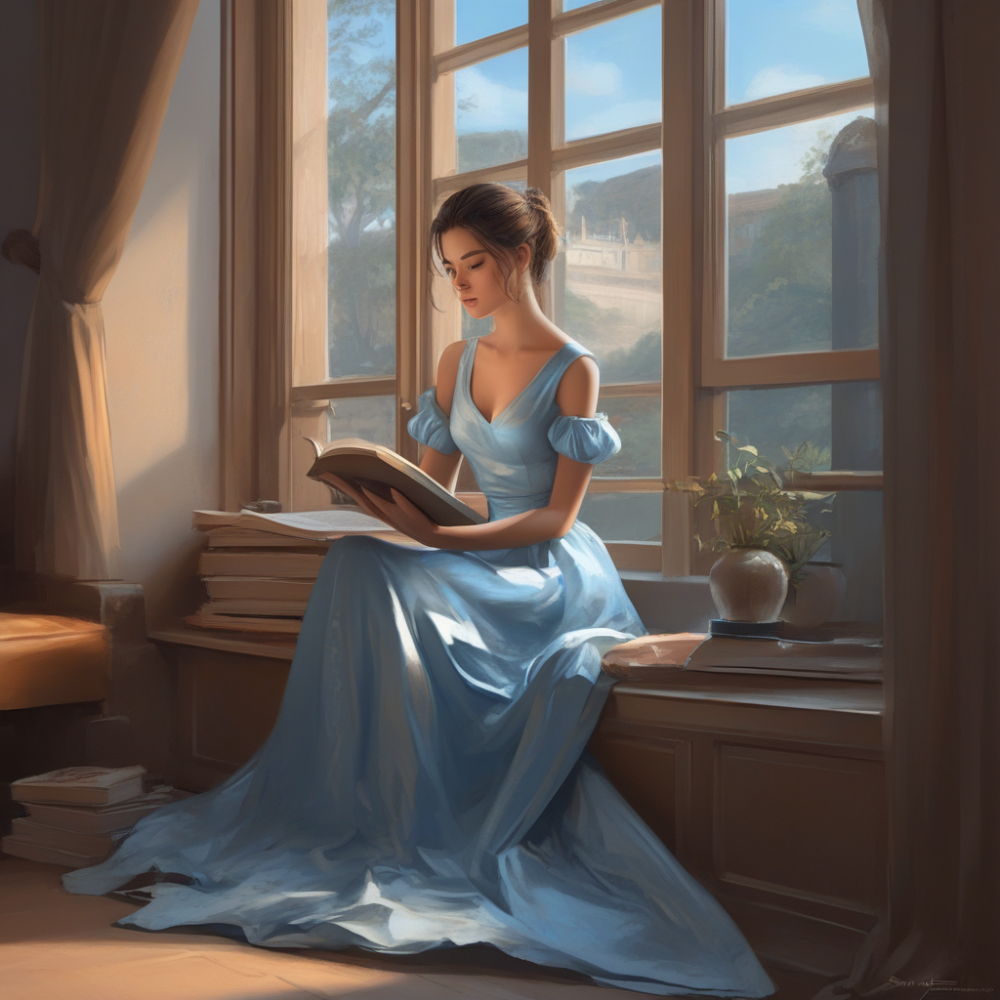

In [ ]:
image = pipe(prompt=prompt, num_inference_steps=25).images[0]
image

  0%|          | 0/25 [00:00<?, ?it/s]

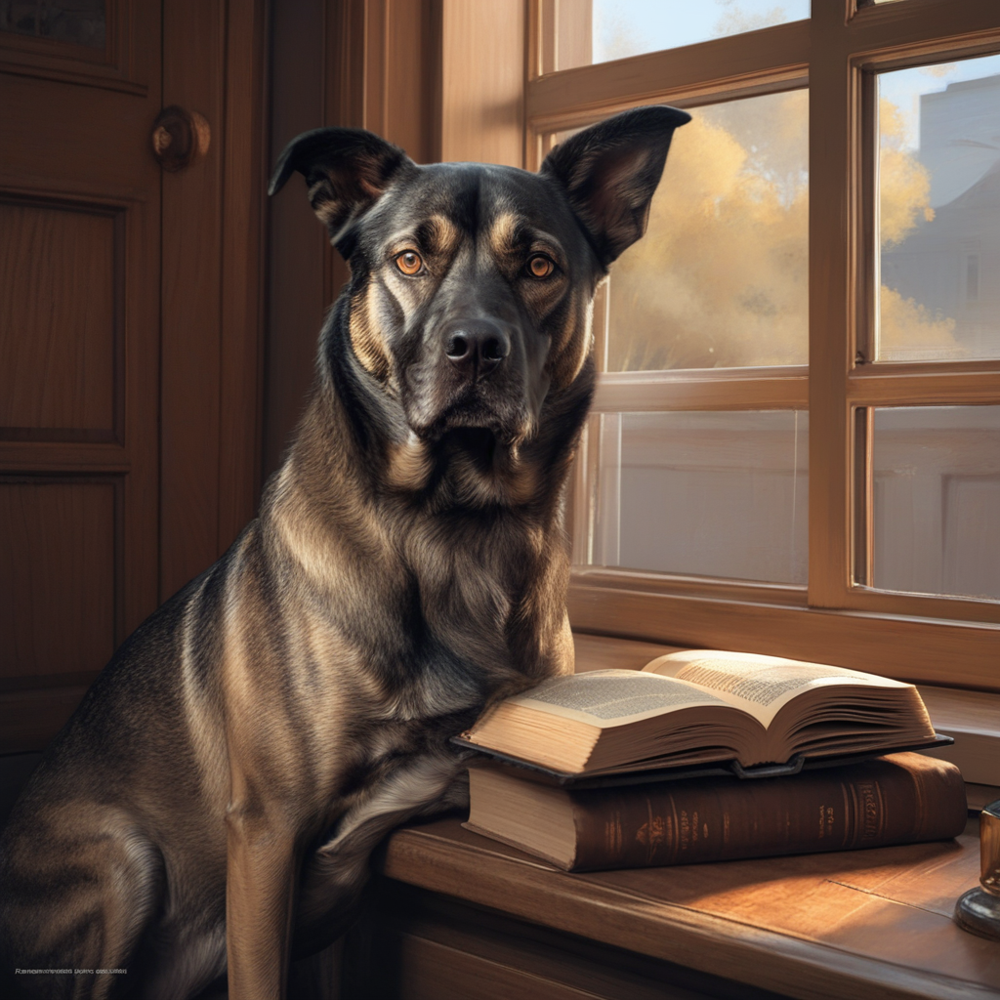

In [ ]:
subject_2 = "sitting next to a wooden window reading a book"
medium = 'digital painting'
artist = 'Stanley Artgerm Lau'
website = 'artstation'
resolution = '8k'
additional_details = "extremely detailed, ornate"
lighting = 'cinematic lighting, rim lighting'
color = 'vivid'
prompt = create_prompt(subject_2=subject_2, medium=medium, artist=artist, website=website, resolution=resolution, additional_details=additional_details, lighting=lighting, color=color)
create_save_image(prompt, 'reading')


  0%|          | 0/25 [00:00<?, ?it/s]

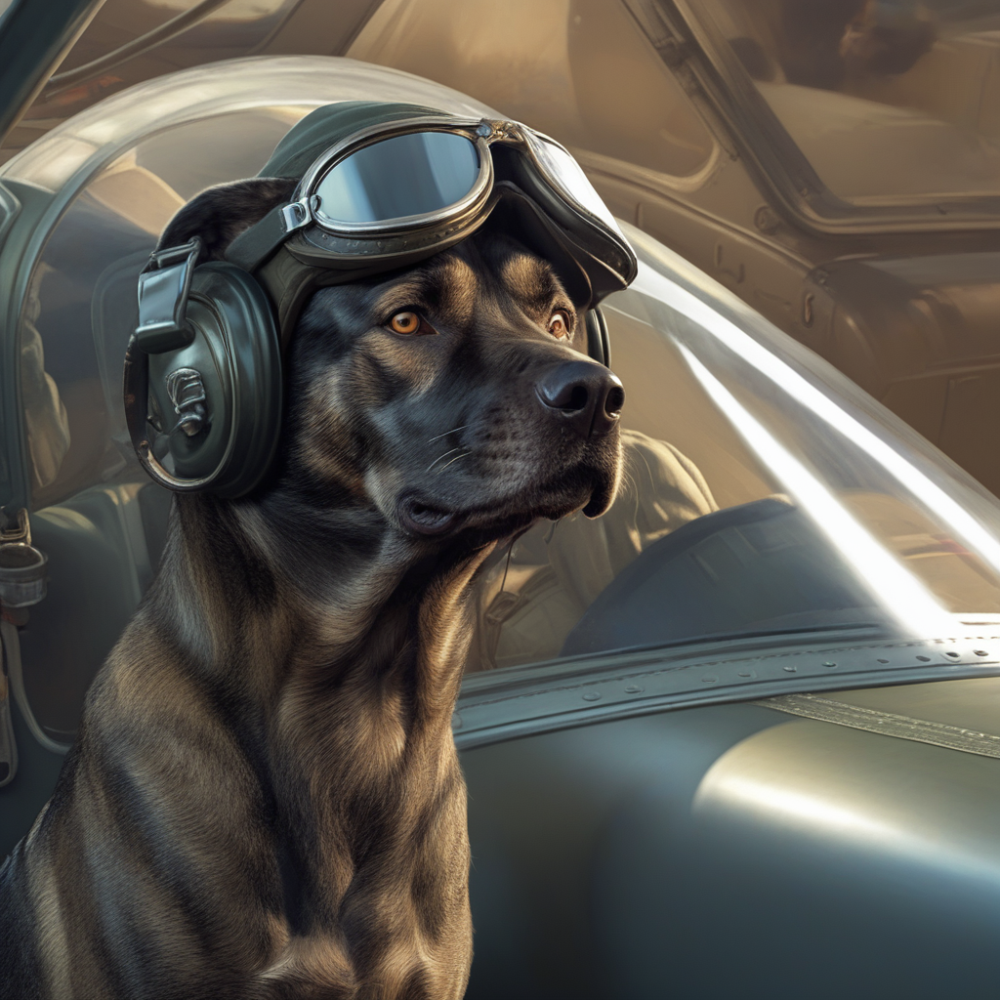

In [ ]:
subject_2 = "as a pilot in the cockpit of a fighter jet"
medium = 'painting'
# artist = 'Stanley Artgerm Lau'
# website = 'artstation'
# resolution = '8k'
additional_details = "extremely detailed, ornate"
lighting = 'cinematic lighting, rim lighting'
color = 'vivid'
prompt = create_prompt(subject_2=subject_2, medium=medium, artist=artist, website=website, resolution=resolution, additional_details=additional_details, lighting=lighting, color=color)
create_save_image(prompt, 'pilot')

  0%|          | 0/25 [00:00<?, ?it/s]

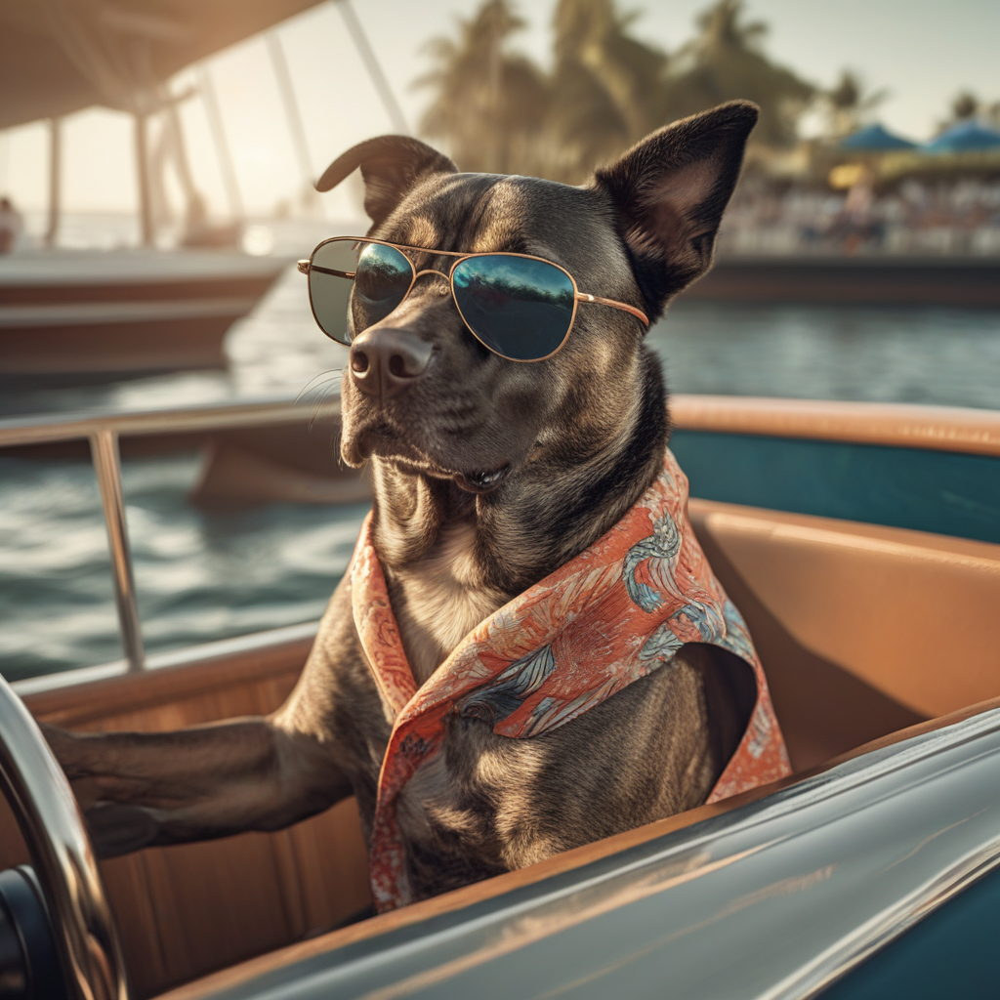

In [ ]:
subject_2 = "driving a boat while wearing sunglasses and a hawaiian shirt"
medium = 'photograph'
# artist = 'Stanley Artgerm Lau'
website = 'artstation'
resolution = '8k'
# additional_details = "extremely detailed, ornate"
# lighting = 'cinematic lighting, rim lighting'
# color = 'vivid'
prompt = create_prompt(subject_2=subject_2, medium=medium, artist=artist, website=website, resolution=resolution, additional_details=additional_details, lighting=lighting, color=color)
create_save_image(prompt, 'captain')

  0%|          | 0/25 [00:00<?, ?it/s]

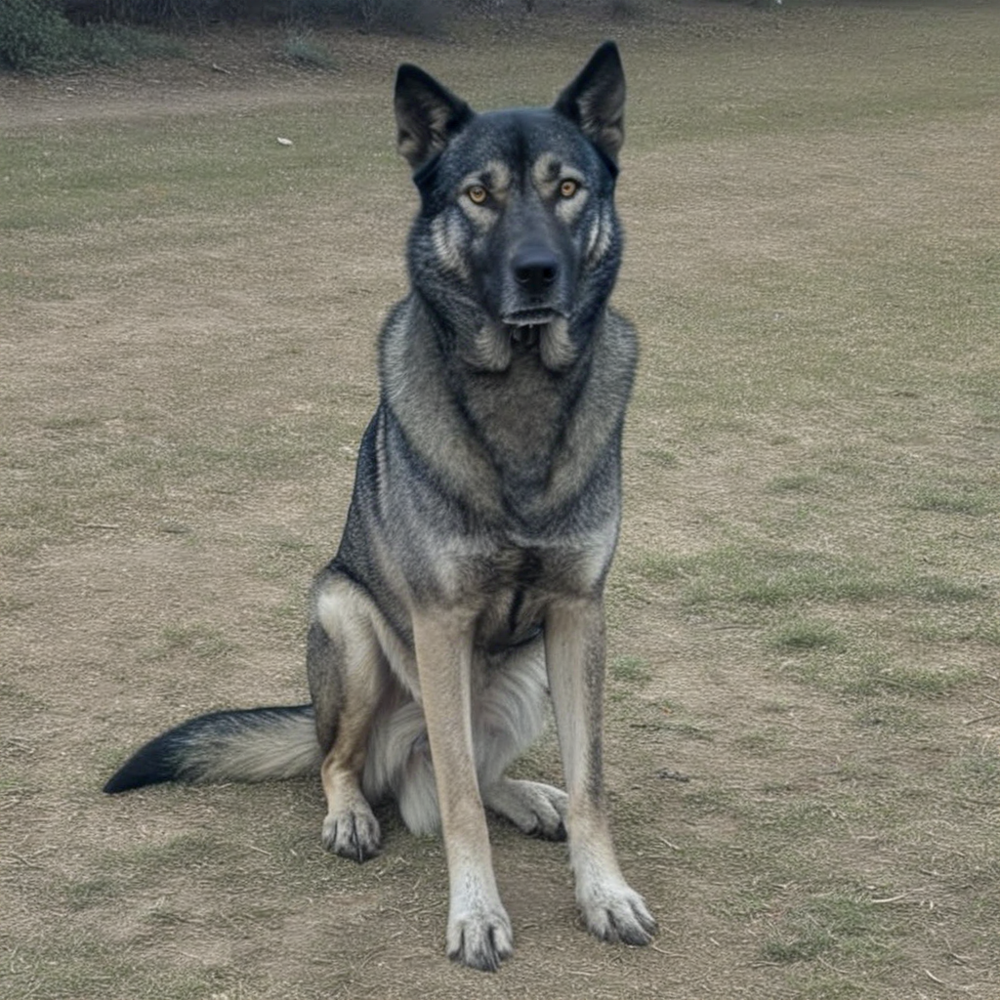

In [ ]:
target = 'wolf'
create_save_image(f"an animal that is half suezzeus dog and half {target}", target)